In [1]:
from torch.utils.data import Dataset
import torch
import glob
import pandas as pd
pd.options.mode.chained_assignment = None
from datetime import datetime
import os
import math
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
import random
import json

from scipy import signal

/home/yhbedoya/VirtualEnvs/SHMmae_venv/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
start_time, end_time = "06/12/2021 00:00", "06/12/2021 00:15"
path = '/home/yhbedoya/Repositories/SHM-MAE/traffic/20211206/'

print(f'reading CSV files')
start = datetime.strptime(start_time, '%d/%m/%Y %H:%M')
end = datetime.strptime(end_time, '%d/%m/%Y %H:%M')

ldf = list()
for p in tqdm(glob.glob(path + "*.csv")):
    name = os.path.split(p)[-1]
    nstr = datetime.strptime(name, 'traffic_%Y%m%dH%H%M%S.csv')
    if start <= nstr < end:
        df_tmp = pd.read_csv(p)
        c_drop = set(df_tmp.columns) - set(["sens_pos", "z", "ts"])
        if len(c_drop) > 0:
            df_tmp.drop(columns=list(c_drop), inplace=True)
        ldf.append(df_tmp)
df = pd.concat(ldf).sort_values(by=['sens_pos', 'ts'])
df.reset_index(inplace=True, drop=True)

#df = df[df['sens_pos'].isin(self.sensors)]
df['ts'] = pd.to_datetime(df['ts'], unit='ms')
df["zN"] = df["z"]-np.mean(df["z"])
df["vars"] = df["zN"].rolling(window=100).var().fillna(0)
df["vars"] = df["vars"].rolling(window=100).mean().fillna(0)

reading CSV files


100%|██████████| 50/50 [00:08<00:00,  5.86it/s]


In [3]:
distanceToSensor = {}
with open('/home/yhbedoya/Repositories/SHM-MAE/LabelGeneration/distanceToSensor.csv') as f:
    for line in f.readlines():
        sensor, distance = line.replace("'", "").replace("\n","").split(",")
        distanceToSensor[sensor] = float(distance)

In [4]:
def interquartileRule(data):
    # Calculate the first quartile (Q1)
    Q1 = np.percentile(data, 25)

    # Calculate the third quartile (Q3)
    Q3 = np.percentile(data, 75)

    # Calculate the interquartile range (IQR)
    IQR = Q3 - Q1

    # Define the upper and lower bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    return lower_bound, upper_bound

In [5]:
import json
with open("/home/yhbedoya/Repositories/SHM-MAE/util/DataLoadersSacertisLabels/sensorVarDict.json", "r") as f:
    # Load the dict from the file
    sensorVarDict = json.load(f)

In [5]:
varDf = df[["sens_pos", "vars"]]
sensorsList = df["sens_pos"].unique()
sensorVarDict = {}
for sensor in tqdm(sensorsList):
    sensorVarDf = varDf[varDf["sens_pos"]==sensor]
    lower_bound, upper_bound = interquartileRule(sensorVarDf["vars"])
    sensorVarDf = sensorVarDf[(sensorVarDf["vars"]>lower_bound) & (sensorVarDf["vars"]<upper_bound)]
    mean = sensorVarDf["vars"].mean()
    std = sensorVarDf["vars"].std()
    threshold = mean + 3.5 * std
    sensorVarDict[sensor] = {"mean": mean, "std": std, "threshold": threshold}
sensorVarDict

100%|██████████| 141/141 [01:15<00:00,  1.86it/s]


{'C1.1.1': {'mean': 1.0497675583102326e-07,
  'std': 1.1971330095152787e-08,
  'threshold': 1.46876411164058e-07},
 'C1.1.2': {'mean': 1.6342461011621894e-07,
  'std': 6.269494198540323e-08,
  'threshold': 3.828569070651303e-07},
 'C1.1.3': {'mean': 1.0652728060874382e-07,
  'std': 1.805307234581004e-08,
  'threshold': 1.6971303381907895e-07},
 'C1.2.1': {'mean': 8.880899442332968e-08,
  'std': 1.0378727164947124e-08,
  'threshold': 1.251345395006446e-07},
 'C1.2.2': {'mean': 9.185827004132618e-08,
  'std': 1.1122381927196884e-08,
  'threshold': 1.307866067865153e-07},
 'C1.2.3': {'mean': 1.2975788635697547e-07,
  'std': 1.839989963020562e-08,
  'threshold': 1.9415753506269515e-07},
 'C10.1.2': {'mean': 1.0998898237393209e-07,
  'std': 2.3569183635495213e-08,
  'threshold': 1.9248112509816534e-07},
 'C10.1.3': {'mean': 1.2898289172731258e-07,
  'std': 3.536890958962614e-08,
  'threshold': 2.5277407529100406e-07},
 'C10.1.4': {'mean': 9.157672097500806e-08,
  'std': 1.2090029847960075e-

In [6]:
pesaDataDf = pd.read_csv("/home/yhbedoya/Repositories/SHM-MAE/dati_pese_dinamiche/dati 2021-12-04_2021-12-12 pesa km 104,450.csv", sep=";", index_col=0)
pesaDataDf = pesaDataDf[["Id", "StartTimeStr", "ClassId", "GrossWeight", "Velocity", "VelocityUnit"]]
pesaDataDf["Time"] = pd.to_datetime(pesaDataDf["StartTimeStr"])
pesaDataDf["Time"] = pesaDataDf["Time"].dt.strftime('%Y-%d-%m %H:%M:00')
pesaDataDf["Time"] = pd.to_datetime(pesaDataDf["Time"]) + pd.to_timedelta(-1,'H')
#pesaDataDf["Time"] = pd.to_datetime(pesaDataDf["Time"]).dt.strftime('%Y-%m-%d %H:%M:00')
pesaDataDf.sort_values(by="Id", inplace=True)
pesaDataDf = pesaDataDf[(pesaDataDf["Time"]>="2021-12-06 00:00:00") & (pesaDataDf["Time"]<="2021-12-06 00:15:00")]
pesaDataDf.reset_index(drop=True, inplace=True)

In [7]:
pesaDataDf.shape

(2, 7)

In [8]:
minDuration = 0.25
def groupsGenerator(data, minTime, maxTime, threshold):
    slice = data[(data["ts"]>= minTime) & (data["ts"]<= maxTime)]
    
    slice["outlier"] = slice["vars"].apply(lambda x: x>=threshold)
    outliers = slice[slice["outlier"] == True].reset_index().to_dict("records")

    if len(outliers) == 0:
        return pd.DataFrame()

    last = minTime
    timeStart = outliers[0]["ts"]
    flag = True
    groups = []
    groupTimes = []
    groupIndexes = []
    groupVars = []
    label = np.nan
    groupId = 0
    for outlier in outliers:
        if ((outlier["ts"] - last).total_seconds() < 2) or flag:
            groupTimes.append(outlier["ts"])
            groupVars.append(outlier["vars"])
            flag = False
            timeEnd = outlier["ts"]
        else:
            start, end = min(groupTimes), max(groupTimes)
            groupSignal = data[(data["ts"]>= start) & (data["ts"]<= end)]["zN"]
            signalPower = np.sqrt(np.mean(np.array(groupSignal)**2))**2 
            pointMaxVar = groupTimes[np.argmax(groupVars)]
            if ((end - start).total_seconds() > minDuration):
                label = {"groupId": groupId,"start": start, "end": end, "signalPower": signalPower, 
                "pointMaxVar": pointMaxVar}
                groups.append(label)
            groupId += 1
            groupTimes = [outlier["ts"],]
            groupVars = [outlier["vars"],]
        last = outlier["ts"]

    start, end = min(groupTimes), max(groupTimes)
    groupSignal = data[(data["ts"]>= start) & (data["ts"]<= end)]["zN"]
    signalPower = np.sqrt(np.mean(np.array(groupSignal)**2))**2 
    pointMaxVar = groupTimes[np.argmax(groupVars)]
    if ((end-start).total_seconds() > minDuration):
            label = {"groupId": groupId,"start": start, "end": end, "signalPower": signalPower, 
            "pointMaxVar": pointMaxVar}
            groups.append(label)

    if len(groups)>0:
        groupsDf = pd.DataFrame(groups).sort_values("signalPower", ascending=False)
    else:
        groupsDf = pd.DataFrame()

    return groupsDf

In [10]:
sensorLabelsDfList = []
groupsDfList = []

sensorsList = df["sens_pos"].unique()
for sensor in sensorsList:
    if (sensor in ["C17.1.2", "C12.1.4"]) or (sensor not in distanceToSensor.keys()) or (sensor not in sensorVarDict.keys()):
        continue
    assignedLabels = {}
    assignedLabels2 = {}
    sensorLabelsDf = pesaDataDf.copy(deep=True)
    sensorLabelsDf["EstimatedTime"] = sensorLabelsDf["Time"] + pd.to_timedelta((float(distanceToSensor[sensor])/(sensorLabelsDf["Velocity"]/3.6))-20,'S')
    sensorLabelsDf["MaxTime"] = sensorLabelsDf["EstimatedTime"] + pd.to_timedelta(120,'S')
    minTime = sensorLabelsDf["EstimatedTime"].min()
    maxTime = sensorLabelsDf["MaxTime"].max()
    sensorLabelsDf.sort_values("GrossWeight", inplace=True, ascending=False)

    sensorData = df[df["sens_pos"]==sensor]
    threshold = sensorVarDict[sensor]["threshold"]
    groupsDf = groupsGenerator(sensorData, minTime, maxTime, threshold)
    availableGroupsDf = groupsDf.copy(deep=True)
    print(f"Total groups found for sensor {sensor}: {groupsDf.shape[0]}")
    if availableGroupsDf.empty:
        continue
    for index, row in sensorLabelsDf.iterrows():
        if row["Id"] in assignedLabels:
            continue
        
        if availableGroupsDf.empty:
            break

        candidatesDf = availableGroupsDf[(row["EstimatedTime"] <= availableGroupsDf["pointMaxVar"]) & (availableGroupsDf["pointMaxVar"] <= row["MaxTime"])]
        if not candidatesDf.empty:
            assignedLabels[row["Id"]] = candidatesDf.iloc[0].to_dict()
            assignedLabels2[candidatesDf.iloc[0]["groupId"]] = row["Id"]
            availableGroupsDf.drop(candidatesDf.index[0], inplace=True)
    
    sensorLabelsDf["sens_pos"] = sensor
    sensorLabelsDf["labels"] = sensorLabelsDf.apply(lambda row: assignedLabels[row["Id"]] if row["Id"] in assignedLabels else np.nan, axis=1)
    sensorLabelsDf.sort_values("Id", inplace=True)
    groupsDf["sens_pos"] = sensor
    groupsDf["labels"] = groupsDf.apply(lambda row: assignedLabels2[row["groupId"]] if row["groupId"] in assignedLabels2 else np.nan, axis=1)
    groupsDf.sort_values("groupId", inplace=True)
    groupsDf.dropna(inplace=True)

    sensorLabelsDfList.append(sensorLabelsDf)
    groupsDfList.append(groupsDf)

labelsDf = pd.concat(sensorLabelsDfList)
groupsDf =  pd.concat(groupsDfList)

Total groups found for sensor C1.1.1: 4
Total groups found for sensor C1.1.2: 49
Total groups found for sensor C1.1.3: 1
Total groups found for sensor C1.2.1: 2
Total groups found for sensor C1.2.2: 3
Total groups found for sensor C1.2.3: 7
Total groups found for sensor C10.1.2: 1
Total groups found for sensor C10.1.3: 24
Total groups found for sensor C10.1.4: 3
Total groups found for sensor C10.2.2: 6
Total groups found for sensor C10.2.3: 2
Total groups found for sensor C10.2.4: 1
Total groups found for sensor C11.1.2: 4
Total groups found for sensor C11.1.3: 2
Total groups found for sensor C11.1.4: 1
Total groups found for sensor C11.2.2: 0
Total groups found for sensor C11.2.3: 3
Total groups found for sensor C11.2.4: 2
Total groups found for sensor C12.1.2: 4
Total groups found for sensor C12.1.3: 10
Total groups found for sensor C12.2.2: 8
Total groups found for sensor C12.2.3: 1
Total groups found for sensor C12.2.4: 1
Total groups found for sensor C13.1.2: 18
Total groups found

In [11]:
print(f"Total labels: {len(labelsDf)}")
totnan = labelsDf["labels"].isna().sum()
print(f"Total nan labels: {totnan}")
print(f"Proportion of match labels: {1-(totnan/len(labelsDf))}")

Total labels: 200
Total nan labels: 84
Proportion of match labels: 0.5800000000000001


In [12]:
counts = groupsDf[["sens_pos", "labels"]].groupby('sens_pos').count()
counts.reset_index(inplace=True)
counts.sort_values("labels", ascending=False, inplace=True)
counts["proportion"] = counts["labels"].apply(lambda x: x/pesaDataDf.shape[0])
counts[:20]

,sens_pos,labels,proportion
75,C5.2.3,2,1.0
85,C7.1.4,2,1.0
55,C2.1.4,2,1.0
1,C1.1.2,2,1.0
45,C17.2.2,2,1.0
64,C3.2.4,2,1.0
66,C4.1.3,2,1.0
35,C15.2.2,2,1.0
34,C15.1.4,2,1.0
70,C4.2.4,2,1.0


In [ ]:
counts.iloc[-40:]

,sens_pos,labels,proportion
24,C13.1.4,1,0.5
23,C13.1.3,1,0.5
22,C13.1.2,1,0.5
21,C12.2.4,1,0.5
20,C12.2.3,1,0.5
17,C12.1.2,1,0.5
16,C11.2.4,1,0.5
15,C11.2.3,1,0.5
14,C11.1.4,1,0.5
12,C11.1.2,1,0.5


### Assign label to windows

In [13]:
sampleRate = 100
frameLength = 198
stepLength = 58
windowLength= 5990
windowStep = 1500

In [14]:
def _transformation(slice):
    sliceN = slice-torch.mean(slice)
    frequencies, times, spectrogram = signal.spectrogram(sliceN,sampleRate,nfft=frameLength,noverlap=(frameLength - stepLength), nperseg=frameLength,mode='psd')

    return frequencies, times, np.log10(spectrogram)

def _normalizer( spectrogram):
    spectrogramNorm = (spectrogram - min) / (max - min)
    return spectrogramNorm

def butter_bandpass( lowcut, highcut, fs, order=5):
    return signal.butter(order, [1, 49], fs=fs, btype='band')

def butter_bandpass_filter( slice, lowcut, highcut, fs, order=5):
    sliceN = slice-np.mean(np.array(slice))
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = signal.lfilter(b, a, sliceN)
    return y

def power( slice):
    signalPower = np.sqrt(np.mean(np.array(slice)**2))**2
    return signalPower

In [15]:
def _labelAssigner(timeSlice, sensor):
    start, end = timeSlice.min(), timeSlice.max()
    vehiclesInSliceDf = groupsDf[(groupsDf["pointMaxVar"]>=start) &
    (groupsDf["pointMaxVar"]<=end) &
    (groupsDf["sens_pos"]==sensor)]
    return vehiclesInSliceDf.shape[0]

In [16]:
def _partitioner(data):
    sensors = data['sens_pos'].unique().tolist()
    print(f'start partitioner')
    partitions = {}
    cumulatedWindows = 0
    limits = dict()
    print(f'Generating windows')
    for sensor in tqdm(sensors):
        if (sensor in ["C17.1.2", "C12.1.4"]) or (sensor not in distanceToSensor.keys()) or (sensor not in sensorVarDict.keys()):
            continue
        sensorData = data[data['sens_pos']==sensor]
        totalFrames = sensorData.shape[0]
        totalWindows = math.ceil((totalFrames-windowLength)/windowStep)
        start = cumulatedWindows
        cumulatedWindows += totalWindows
        end = cumulatedWindows
        indexStart = sensorData.index[0]
        partitions[sensor]= (start, end, indexStart)


    timeData = torch.tensor(data["z"].values, dtype=torch.float64)
    timestamps = data["ts"]
    cummulator = -1

    mins = list()
    maxs = list()
    print(f'Defining useful windows limits')
    indexes = list(range(0, cumulatedWindows))
    random.shuffle(indexes)

    for index in tqdm(indexes):
        if cummulator >= 500000:
            break
        for sensor,v in partitions.items():
            if index in range(v[0], v[1]):
                start = v[2]+(index-v[0])*windowStep
                timeSlice = timestamps[start: start+windowLength]
                label = _labelAssigner(timeSlice, sensor)
                filteredSlice = butter_bandpass_filter(timeData[start: start+windowLength], 0, 50, sampleRate)
                signalPower = power(filteredSlice)

                if (signalPower>1.25*10**-6) or (label>0):
                    cummulator += 1
                    limits[cummulator] = (start, start+windowLength, label, timeSlice, sensor)
                    slice = timeData[start:start+windowLength]
                    frequencies, times, spectrogram = _transformation(torch.tensor(slice, dtype=torch.float64))
                    mins.append(np.min(np.array(spectrogram)))
                    maxs.append(np.max(np.array(spectrogram)))
                break
    print(f'Total windows in dataset: {cummulator}')
    min = np.min(np.array(mins))
    max = np.max(np.array(maxs))   
    print(f'General min: {min}')
    print(f'General max: {max}')
    return timeData, limits, cummulator, min, max

In [17]:
newDataDf = df.copy(deep=True)
timeData, limits, cummulator, min, max = _partitioner(newDataDf)

start partitioner
Generating windows


100%|██████████| 141/141 [00:46<00:00,  3.04it/s]


Defining useful windows limits


100%|██████████| 6283/6283 [00:07<00:00, 808.70it/s]

Total windows in dataset: 428
General min: -18.170151444082286
General max: -5.8364430069505655


In [18]:
def __getitem__(index):
    start, end, label, timeSlice, sensor = limits[index]
    slice = df[start:end]
    z, vars =  torch.tensor(slice["z"].tolist(), dtype=torch.float64), slice["vars"]
    frequencies, times, spectrogram = _transformation(z)
    spectrogram = torch.unsqueeze(torch.tensor(spectrogram, dtype=torch.float64), 0)
    NormSpect = _normalizer(spectrogram).type(torch.float16)
    #print(f'type {type(NormSpect)}, inp shape: {slice.shape} out shape: {NormSpect.shape}')
    return frequencies, times, spectrogram, z, label, vars, timeSlice, sensor

In [19]:
def plotSpect(frequencies, times, spectrogram, label):
    plt.pcolormesh(times, frequencies, 10*(np.squeeze(spectrogram)), vmin=-150, vmax=-50)
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    plt.colorbar(format="%+2.f", label='dB')

In [20]:
def multiplot(frequencies, times, spectrogram, slice, label, vars, timeSlice, sensor):
    #print(f"{np.min(timeSlice)}, {np.max(timeSlice)}")
    provDf = pd.DataFrame({"z":slice, "ts":timeSlice}).reset_index(drop=True)
    lines = []
    #for index, row in label.iterrows(): 
    #    subSetDf = provDf[(provDf["ts"]>=row["start"])&(provDf["ts"]<=row["end"])]
    #    subSetDf2 = provDf[provDf["ts"]<=row["pointMaxVar"]]
    #    minLine, maxLine, labelLine = np.min(subSetDf.index), np.max(subSetDf.index), np.max(subSetDf2.index)
    #    lines.append((minLine, maxLine, labelLine))
    
    plt.rcParams['figure.figsize'] = [30, 8]

    plt.subplot(1, 3, 1)
    plotSpect(frequencies, times, spectrogram, "original")

    plt.subplot(1, 3, 2)
    plt.title(f"Plots comparison. Label: {label}, sensor: {sensor}")
    plt.ylim(-0.015, 0.015)
    plt.plot(slice)
    #for line in lines:
    #    plt.axvline(line[0], color='r')
    #    plt.axvline(line[1], color='r')
    #    plt.axvline(line[2], color='g')

    plt.subplot(1, 3, 3)
    plt.axhline(y=sensorVarDict[sensor]["threshold"], color='r')
    plt.ylim(0, 2*sensorVarDict[sensor]["threshold"])
    plt.plot(vars)

    plt.show()

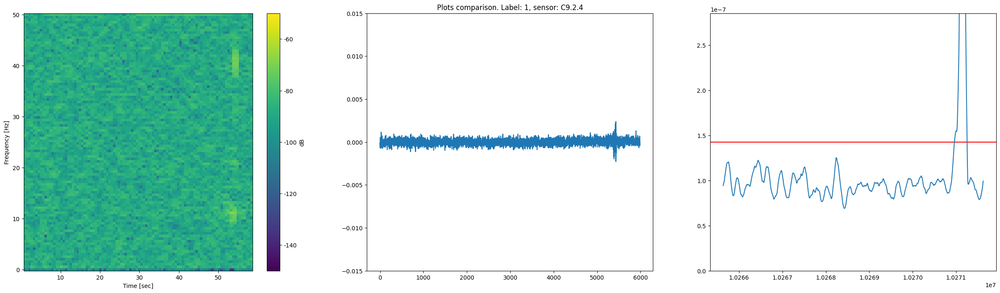

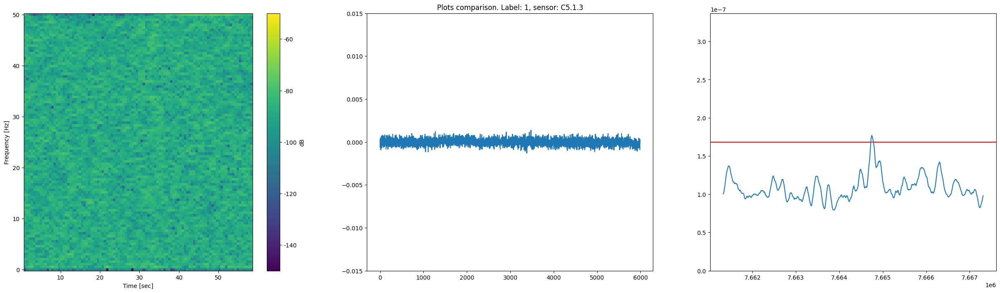

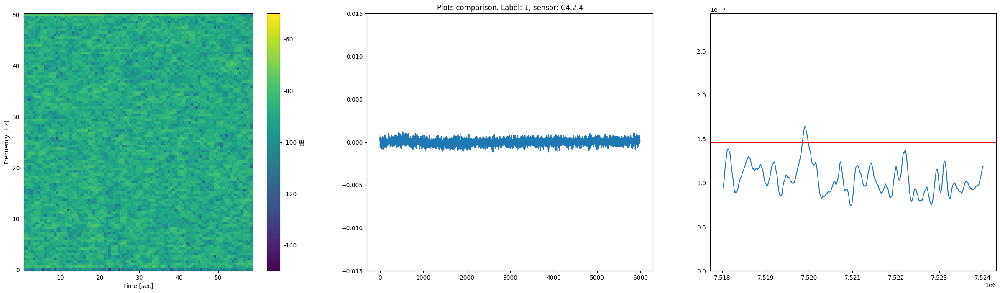

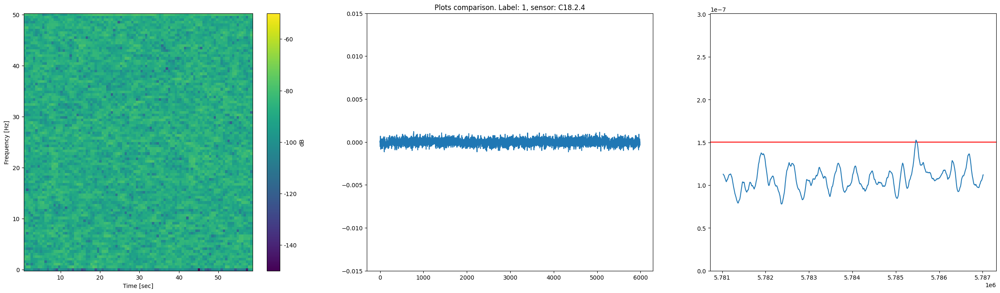

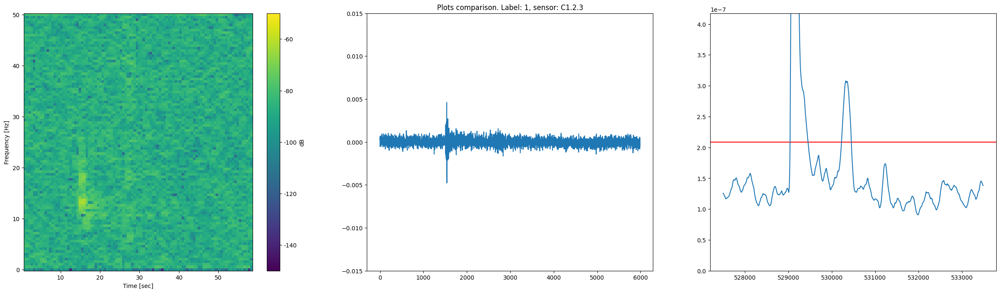

...

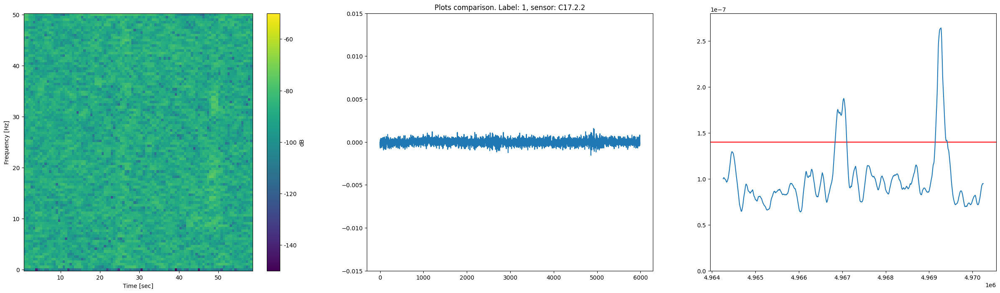

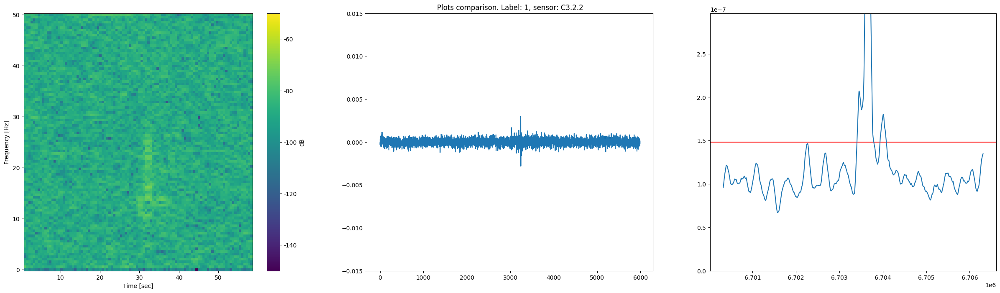

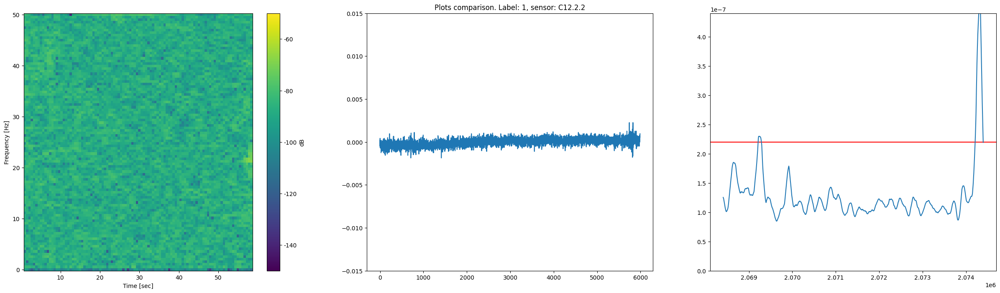

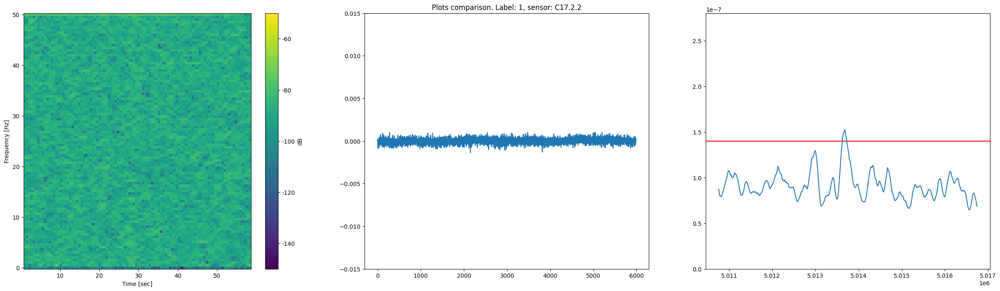

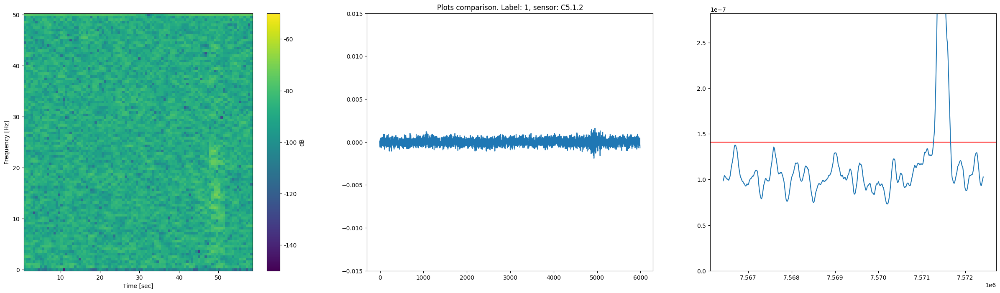

In [23]:
indexes = [random.randint(0, 428) for i in range(100)]
for i in indexes:
    frequencies, times, spectrogram, slice, label, vars, timeSlice, sensor = __getitem__(i)
    sliceN = slice-torch.mean(slice)
    multiplot(frequencies, times, spectrogram, sliceN, label, vars, timeSlice, sensor)

### Time Analysis

In [26]:
labelsDf

,Id,StartTimeStr,ClassId,GrossWeight,Velocity,VelocityUnit,Time,EstimatedTime,MaxTime,sens_pos,labels
0,55188,05/12/2021 13:00,Classe 1,1770,90,Km/h,2021-12-05 12:00:00,2021-12-05 12:00:04.000000000,2021-12-05 12:02:04.000000000,C1.1.1,"{'groupId': 2, 'start': 2021-12-05 12:01:04.25..."
1,55189,05/12/2021 13:00,Classe 1,2085,95,Km/h,2021-12-05 12:00:00,2021-12-05 12:00:02.736842105,2021-12-05 12:02:02.736842105,C1.1.1,"{'groupId': 1, 'start': 2021-12-05 12:00:55.79..."
2,55190,05/12/2021 13:00,Classe 1,2045,104,Km/h,2021-12-05 12:00:00,2021-12-05 12:00:00.769230769,2021-12-05 12:02:00.769230769,C1.1.1,"{'groupId': 3, 'start': 2021-12-05 12:01:24.87..."
3,55191,05/12/2021 13:00,Classe 1,2165,93,Km/h,2021-12-05 12:00:00,2021-12-05 12:00:03.225806452,2021-12-05 12:02:03.225806452,C1.1.1,"{'groupId': 0, 'start': 2021-12-05 12:00:32.71..."
4,55192,05/12/2021 13:01,Classe 1,1330,77,Km/h,2021-12-05 12:01:00,2021-12-05 12:01:08.051948052,2021-12-05 12:03:08.051948052,C1.1.1,"{'groupId': 4, 'start': 2021-12-05 12:01:37.09..."
...,...,...,...,...,...,...,...,...,...,...,...
544,55732,05/12/2021 14:58,Classe 1,1880,83,Km/h,2021-12-05 13:58:00,2021-12-05 13:58:17.459084337,2021-12-05 14:00:17.459084337,C9.2.4,NaN
545,55733,05/12/2021 14:58,Classe 1,1515,78,Km/h,2021-12-05 13:58:00,2021-12-05 13:58:19.860307692,2021-12-05 14:00:19.860307692,C9.2.4,NaN
546,55734,05/12/2021 14:58,Classe 1,2190,113,Km/h,2021-12-05 13:58:00,2021-12-05 13:58:07.514194689,2021-12-05 14:00:07.514194689,C9.2.4,"{'groupId': 330, 'start': 2021-12-05 13:59:36...."
547,55735,05/12/2021 14:59,Classe 1,1290,91,Km/h,2021-12-05 13:59:00,2021-12-05 13:59:14.165978022,2021-12-05 14:01:14.165978022,C9.2.4,NaN


In [27]:
labelsDf["labels"].iloc[0]

{'groupId': 2,
 'start': Timestamp('2021-12-05 12:01:04.258000'),
 'end': Timestamp('2021-12-05 12:01:05.908000'),
 'signalPower': 0.0003344386054589468,
 'pointMaxVar': Timestamp('2021-12-05 12:01:05.028000')}

In [ ]:
from pandas import Timestamp

start = Timestamp('2021-12-05 12:00')
end = Timestamp('2021-12-05 14:00')

sensorsList = df["sens_pos"].unique()
#randomSensors = random.sample(sensorsList, 15)
for sensor in tqdm(sensorsList):
    sensorLabelDf = labelsDf[(labelsDf["sens_pos"]==sensor) & (labelsDf["Time"] >= start) & (labelsDf["Time"] <= end)]
    groupedDf = sensorLabelDf[["Time", "Id", "labels"]].groupby("Time").agg({"Id": "count", "labels": "count"}).reset_index()

    sensorData = df[df['sens_pos']==sensor]
    lines = []

    for index, row in sensorLabelDf.iterrows(): 
        if not row["labels"] == row["labels"]:
            continue
        if row["labels"]["start"]>end:
            continue
        minLine, maxLine = row["labels"]["start"], row["labels"]["end"]
        lines.append((minLine, maxLine))

    plt.subplot(2, 1, 1)
    plt.plot(groupedDf['Time'], groupedDf['Id'], marker='o', label='Expected count')
    plt.plot(groupedDf['Time'], groupedDf['labels'], marker='o', label='Real count')
    plt.xlabel('Timestamp (minutes)')
    plt.ylabel('Count')
    plt.legend()
    plt.title(f"Sensor: {sensor} init time {start} finish time {end}")

    #filteredSensorData = sensorData[(sensorData["ts"] >= start) & (sensorData["ts"] <= end)]
    #plt.subplot(2, 1, 2)
    #plt.plot(filteredSensorData['ts'], filteredSensorData['zN'], label='signal')
    #plt.xlabel('Timestamp (minutes)')
    #plt.ylabel('Difference')
    #for line in lines:
    #    plt.axvline(line[0], color='r')
    #    plt.axvline(line[1], color='r')
    #plt.legend()
    
    plt.show()